# **Imports**

In [ ]:
import numpy as np
import pandas as pd
import torch
from torch import nn, cuda
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from matplotlib import pyplot as plt
import os
import zipfile
import torch.nn.functional as F
from tqdm import tqdm
import torchvision
import time
!pip install tabulate
from tabulate import tabulate


# **DataSet Class**

In [ ]:
class SiameseDataset(Dataset):
    """
    A Dataset class for preparing data for Siamese Neural Networks in one-shot learning.

    This dataset is designed for facial recognition tasks and includes pairs of images along with a label
    indicating whether the images belong to the same person or not.

    """

    def __init__(self, data_frame, transformations=None):
        """
        Initializes the SiameseDataset instance and processes the image pairs.
        """
        self.data_set = data_frame
        self.transform = transformations
        self.images = []
        self.process_images()

    def __len__(self):
        """
        Returns the total number of image pairs in the dataset.
        """
        return len(self.data_set)

    def __getitem__(self, idx):
        """
        Retrieves the image pair and label at the specified index.

        """
        img1, img2, label = self.images[idx]
        return img1, img2, label

    def apply_transformations(self, img):
        """
        Applies the specified transformations to a single image.

        """
        img_after_transform = self.transform(img)
        return img_after_transform

    def process_images(self):
        """
        Processes all image pairs in the dataset, applying transformations if specified.
        """
        for index in range(len(self.data_set)):
            img1_path = self.data_set['image1'].iloc[index]
            img2_path = self.data_set['image2'].iloc[index]
            label = self.data_set['label'].iloc[index]

            # Load images
            img1, img2 = Image.open(img1_path), Image.open(img2_path)

            # Apply transformations if provided
            if self.transform is not None:
                img1 = self.apply_transformations(img1)
                img2 = self.apply_transformations(img2)
            else:
                img1 = transforms.ToTensor()(img1)
                img2 = transforms.ToTensor()(img2)

            # Append the processed data to the images list
            self.images.append((img1, img2, torch.tensor(float(label))))


# **Model**

In [ ]:
class SiameseModel(nn.Module):
    """
    A PyTorch implementation of a Siamese Neural Network.

    This model processes image pairs through convolutional layers to extract features,
    compares them using a distance metric (absolute difference), and predicts whether
    the images belong to the same class.
    """

    def __init__(self, dropout_rate):
        """
        Initializes the SiameseModel with specified dropout rate and constructs the network layers.
        """
        super().__init__()
        self.initialize_weights()

        self.layers = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=64, kernel_size=10),
            nn.BatchNorm2d(num_features=64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(in_channels=64, out_channels=128, kernel_size=7),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=4),
            nn.BatchNorm2d(num_features=128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2),
            nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4),
            nn.BatchNorm2d(num_features=256),
            nn.ReLU(inplace=True),
        )

        # Fully connected layers
        self.fc1 = nn.Sequential(nn.Linear(9216, 4096), nn.ReLU())
        self.dropout = nn.Dropout(dropout_rate)
        self.fc2 = nn.Sequential(nn.Linear(4096, 1))

    def forward(self, x1, x2):
        """
        Performs a forward pass through the model for a pair of input images.
        """
        x1 = self.single_img_forward(x1)
        x2 = self.single_img_forward(x2)
        result = torch.abs(x1 - x2)
        result = self.fc2(result)
        return result

    def single_img_forward(self, x):
        """
        Processes a single image through the convolutional layers and fully connected layers.
        """
        x = self.layers(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc1(x)
        x = self.dropout(x)
        return x

    def initialize_weights(self):
        """
        Initializes the weights of the network's layers using a truncated normal distribution.
        """
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.trunc_normal_(m.weight, mean=0, std=0.01)
                if m.bias is not None:
                    nn.init.trunc_normal_(m.bias, mean=0.5, std=0.01)
            elif isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, mean=0, std=0.02)
                if m.bias is not None:
                    nn.init.trunc_normal_(m.bias, mean=0.5, std=0.01)


# **Load Data**

In [ ]:
def load_data(txt_file_path, zip_file_path='/content/lfw2.zip', unzip_dir='/content/lfw2/lfw2'):
    """
    Loads a dataset of image pairs for training a Siamese Neural Network.

    This function processes a dataset based on a text file that contains image pair paths and their labels.
    It unzips the image data if not already unzipped, organizes image pairs, and returns the data in a structured format.
    Pairs of images are either of the same person (label 1.0) or different persons (label 0.0).
    """
    # Unzip the dataset to '/content' if not already unzipped
    if not os.path.exists(unzip_dir):
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall('/content')  # Extract directly to '/content'

    dataset = []
    with open(txt_file_path) as f:
        lines = f.readlines()
        lines = lines[1:]
        for line in lines:
            line = line.rstrip("\n")
            line = line.split("\t")
            if len(line) > 3:  # Two different persons
                path1 = os.path.join(unzip_dir, line[0])
                path2 = os.path.join(unzip_dir, line[2])
                name1 = ""
                name2 = ""
                for image_name in os.listdir(path1):
                    if image_name.endswith(f"0{line[1]}.jpg"):
                        name1 = image_name
                for image_name in os.listdir(path2):
                    if image_name.endswith(f"0{line[3]}.jpg"):
                        name2 = image_name
                dataset.append([
                    os.path.join(path1, name1),
                    os.path.join(path2, name2),
                    0.0
                ])
            else:  # Same person
                path = os.path.join(unzip_dir, line[0])
                name1 = ""
                name2 = ""
                for image_name in os.listdir(path):
                    if image_name.endswith(f"0{line[1]}.jpg"):
                        name1 = image_name
                    if image_name.endswith(f"0{line[2]}.jpg"):
                        name2 = image_name
                dataset.append([
                    os.path.join(path, name1),
                    os.path.join(path, name2),
                    1.0
                ])

    dataset = pd.DataFrame(dataset, columns=["image1", "image2", "label"])
    return dataset


# **Analysis Of The Dataset**

In [ ]:
train_dataframe = load_data("pairsDevTrain.txt")
test_dataframe = load_data("pairsDevTest.txt")
train_dataset = SiameseDataset(train_dataframe)
test_dataset = SiameseDataset(test_dataframe)



In [ ]:
print(f"The size of the training data {len(train_dataset)}")
print(f"The size of the testing data {len(test_dataset)}")


The size of the training data 2200
The size of the testing data 1000


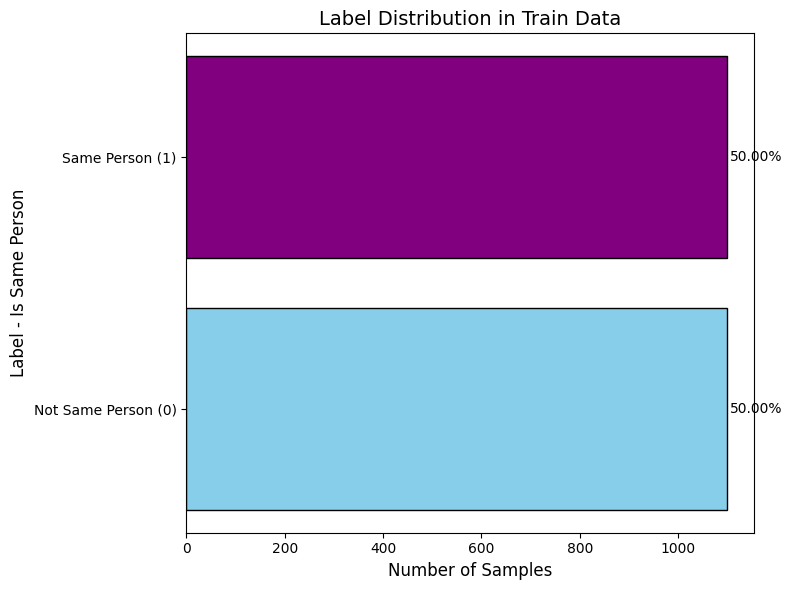

In [ ]:

counts = train_dataframe['label'].value_counts()
percentages = counts / counts.sum() * 100

# Create the figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Create horizontal bars
bars = ax.barh(
    counts.index.astype(str),
    counts.values,
    color=['skyblue', 'purple'],
    edgecolor='black'
)

# Add percentages as annotations
for bar, percentage in zip(bars, percentages):
    ax.text(
        bar.get_width() + 5,  # Offset the text slightly to the right of the bar
        bar.get_y() + bar.get_height() / 2,  # Center vertically
        f"{percentage:.2f}%",
        va='center',
        fontsize=10
    )

# Add titles and labels
ax.set_title("Label Distribution in Train Data", fontsize=14)
ax.set_xlabel("Number of Samples", fontsize=12)
ax.set_ylabel("Label - Is Same Person", fontsize=12)
ax.set_yticks(range(len(counts.index)))
ax.set_yticklabels(["Not Same Person (0)", "Same Person (1)"] if 0 in counts.index else counts.index)

plt.tight_layout()
plt.show()


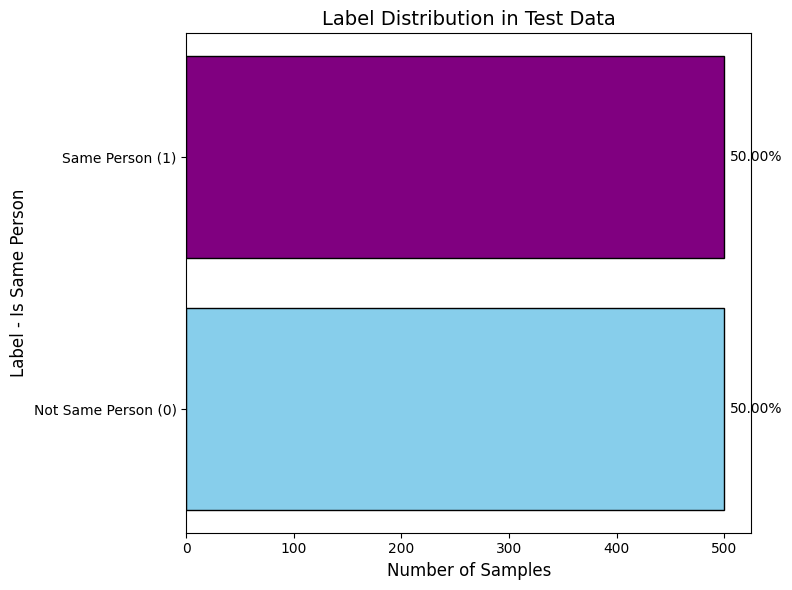

In [ ]:

counts = test_dataframe['label'].value_counts()
percentages = counts / counts.sum() * 100

# Create the figure and axis
fig, ax = plt.subplots(figsize=(8, 6))

# Create horizontal bars
bars = ax.barh(
    counts.index.astype(str),
    counts.values,
    color=['skyblue', 'purple'],
    edgecolor='black'
)

# Add percentages as annotations
for bar, percentage in zip(bars, percentages):
    ax.text(
        bar.get_width() + 5,  # Offset the text slightly to the right of the bar
        bar.get_y() + bar.get_height() / 2,  # Center vertically
        f"{percentage:.2f}%",
        va='center',
        fontsize=10
    )

# Add titles and labels
ax.set_title("Label Distribution in Test Data", fontsize=14)
ax.set_xlabel("Number of Samples", fontsize=12)
ax.set_ylabel("Label - Is Same Person", fontsize=12)
ax.set_yticks(range(len(counts.index)))
ax.set_yticklabels(["Not Same Person (0)", "Same Person (1)"] if 0 in counts.index else counts.index)

plt.tight_layout()
plt.show()


# **Training and Evaluation**

In [ ]:
!pip install tqdm


In [ ]:
from tqdm import tqdm


In [ ]:

paper_transfor = transforms.Compose([transforms.Resize((105,105)),
                                     transforms.ToTensor(),
                                    ])

In [ ]:
# Load the training and testing datasets from text files.
train_dataset = load_data("pairsDevTrain.txt")
test_dataset = load_data("pairsDevTest.txt")

# Apply transformations defined in 'paper_transfor' to preprocess the image pairs.
train_dataset = SiameseDataset(train_dataset, transformations=paper_transfor)
test_dataset = SiameseDataset(test_dataset, transformations=paper_transfor)

# Set a random seed for reproducibility when splitting the dataset.
torch.manual_seed(42)

# Split the training dataset into training and validation sets.
# 80% of the data is used for training, and 20% is reserved for validation.
train_set, validation_set = torch.utils.data.random_split(
    train_dataset,
    [int(len(train_dataset) * 0.8), int(len(train_dataset) * 0.2)]
)


# **Hyper Parameters Grid Search**

In [ ]:
def initialize_model(dropout_rate):
    """
    Initializes a Siamese model with a specified dropout rate and moves it to the appropriate device.
    """
    model = SiameseModel(dropout_rate=dropout_rate)
    return model.to(device)


def evaluate_model(model, dataloader, criterion):
    """
    Evaluates the model's performance on a dataset, computing the average loss and accuracy.
    """
    model.eval()
    total_loss = 0
    correct_predictions = 0
    total_predictions = 0

    with torch.no_grad():
        for img1, img2, labels in dataloader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            outputs = model(img1, img2)
            loss = criterion(outputs, labels.unsqueeze(1))
            total_loss += loss.item()
            predicted = torch.round(torch.sigmoid(outputs))
            correct_predictions += (predicted == labels.unsqueeze(1)).sum().item()
            total_predictions += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    accuracy = correct_predictions / total_predictions
    return avg_loss, accuracy


def evaluate_test_set(model, dataloader_test, criterion):
    """
    Evaluates the model on the test dataset and prints the loss and accuracy.
    """
    avg_test_loss, test_accuracy = evaluate_model(model, dataloader_test, criterion)
    print(f'Test Loss: {avg_test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')
    return avg_test_loss, test_accuracy


def train_one_epoch(model, optimizer, dataloader, criterion):
    """
    Trains the model for one epoch, computing the average loss and accuracy.
    """
    model.train()
    running_loss = 0.0
    correct_predictions = 0
    total_predictions = 0

    for img1, img2, labels in dataloader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(img1, img2)
        loss = criterion(outputs, labels.unsqueeze(1))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        predicted = torch.round(torch.sigmoid(outputs))
        correct_predictions += (predicted == labels.unsqueeze(1)).sum().item()
        total_predictions += labels.size(0)

    avg_loss = running_loss / len(dataloader)
    accuracy = correct_predictions / total_predictions
    return avg_loss, accuracy


def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, optimizer_name, lr, bs, dr, wd, epochs):
    """
    Plots training and validation losses and accuracies over the training epochs.
    """
    num_epochs = len(train_losses)  # Use actual length of lists

    plt.figure(figsize=(12, 12))  # Increase figure height for better spacing

    # Loss plot (Top plot)
    plt.subplot(2, 1, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss", color='green')
    plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f"Training vs Validation Loss (lr={lr}, batch_size={bs}, dropout_rate={dr}, weight_decay={wd}, optimizer={optimizer_name})")
    plt.legend()

    # Accuracy plot (Bottom plot)
    plt.subplot(2, 1, 2)
    plt.plot(range(1, num_epochs + 1), train_accuracies, label="Training Accuracy", color='green')
    plt.plot(range(1, num_epochs + 1), val_accuracies, label="Validation Accuracy", color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f"Training vs Validation Accuracy (lr={lr}, batch_size={bs}, dropout_rate={dr}, weight_decay={wd}, optimizer={optimizer_name})")
    plt.legend()

    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()


def find_best_hyperparams(device):
    """
    Performs a search over hyperparameter combinations to find the best-performing model out of the chosen experiments.
    Tracks and plots training, validation, and test metrics for each combination.
    """
    best_val_loss = float('inf')
    best_hyperparams = None
    hyperparameter_results = []
    models = []
    criterion = nn.BCEWithLogitsLoss()

    # Define hyperparameter grid
    hyperparameter_grid = {
        "lr": [0.01, 0.001, 0.0001],
        "batch_size": [32, 64],
        "dropout_rate": [0],  # Without dropout
        "weight_decay": [0.01, 0.001],  # L2 regularization
        "epochs": [10, 20],
        "optimizer": ["adam", "sgd"]
    }

    # Perform grid search
    for lr in hyperparameter_grid["lr"]:
        for bs in hyperparameter_grid["batch_size"]:
            for dr in hyperparameter_grid["dropout_rate"]:
                for wd in hyperparameter_grid["weight_decay"]:
                    for epochs in hyperparameter_grid["epochs"]:
                        for optimizer_name in hyperparameter_grid["optimizer"]:
                            start = time.time()
                            model = initialize_model(dr)

                            # Set optimizer
                            if optimizer_name == "adam":
                                optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
                            elif optimizer_name == "sgd":
                                optimizer = torch.optim.SGD(model.parameters(), lr=lr, weight_decay=wd, momentum=0.9)

                            # Load data
                            dataloader_train = DataLoader(dataset=train_set, batch_size=bs, shuffle=True)
                            dataloader_val = DataLoader(dataset=validation_set, batch_size=bs, shuffle=False)
                            dataloader_test = DataLoader(dataset=test_dataset, batch_size=bs, shuffle=False)

                            # Train and validate model
                            train_losses, val_losses, train_accuracies, val_accuracies = [], [], [], []
                            early_stop_counter = 5

                            for epoch in range(epochs):
                                train_loss, train_accuracy = train_one_epoch(model, optimizer, dataloader_train, criterion)
                                val_loss, val_accuracy = evaluate_model(model, dataloader_val, criterion)

                                train_losses.append(train_loss)
                                val_losses.append(val_loss)
                                train_accuracies.append(train_accuracy)
                                val_accuracies.append(val_accuracy)

                                # Early stopping
                                if val_loss < best_val_loss:
                                    best_val_loss = val_loss
                                    early_stop_counter = 5
                                else:
                                    early_stop_counter -= 1

                                if early_stop_counter <= 0:
                                    break

                            end = time.time()
                            running_time = round((end - start), 2)

                            # Evaluate final performance
                            test_loss, test_accuracy = evaluate_test_set(model, dataloader_test, criterion)
                            hyperparameter_results.append({
                                "lr": lr, "batch_size": bs, "dropout_rate": dr, "weight_decay": wd, "epochs": epochs,
                                "optimizer": optimizer_name, "run time (sec)": running_time,
                                "val_loss": val_loss, "val_accuracy": val_accuracy, "test_loss": test_loss, "test_accuracy": test_accuracy
                            })

    return best_hyperparams, hyperparameter_results


Analyzing Hyperparameters: lr=0.01, batch_size=32, dropout_rate=0, weight_decay=0.01, epochs=10, optimizer=adam
Epoch [1/10], Train Loss: 17.7573, Train Accuracy: 0.5051, Valid Loss: 1.9167, Valid Accuracy: 0.5705
Epoch [2/10], Train Loss: 1.9684, Train Accuracy: 0.5415, Valid Loss: 0.8848, Valid Accuracy: 0.5182
Epoch [3/10], Train Loss: 0.7636, Train Accuracy: 0.5386, Valid Loss: 0.6790, Valid Accuracy: 0.5818
Epoch [4/10], Train Loss: 0.6829, Train Accuracy: 0.5733, Valid Loss: 0.7252, Valid Accuracy: 0.5250
Epoch [5/10], Train Loss: 0.6914, Train Accuracy: 0.5653, Valid Loss: 0.6762, Valid Accuracy: 0.5886
Epoch [6/10], Train Loss: 0.6832, Train Accuracy: 0.5733, Valid Loss: 0.6749, Valid Accuracy: 0.5818
Epoch [7/10], Train Loss: 0.6937, Train Accuracy: 0.5642, Valid Loss: 0.7189, Valid Accuracy: 0.5477
Epoch [8/10], Train Loss: 0.6849, Train Accuracy: 0.5693, Valid Loss: 0.7039, Valid Accuracy: 0.5205
Epoch [9/10], Train Loss: 0.6855, Train Accuracy: 0.5830, Valid Loss: 0.6763, V

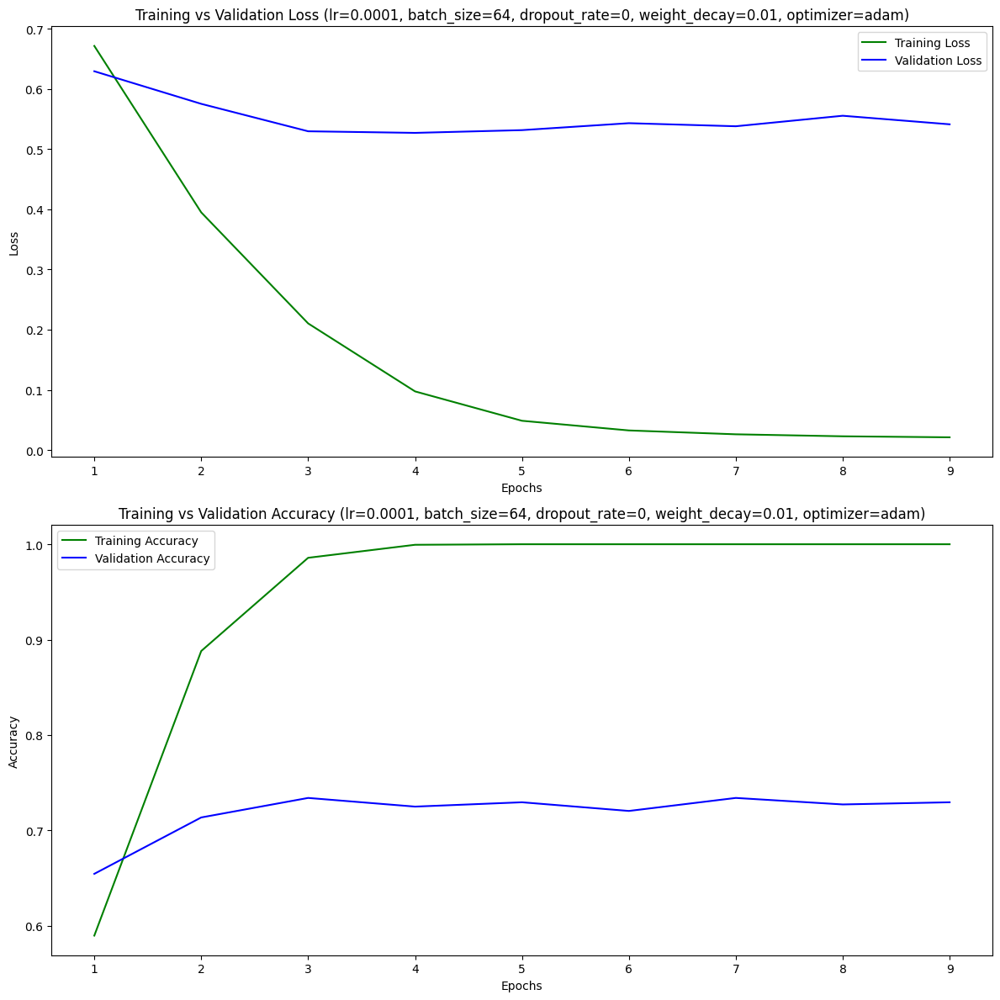

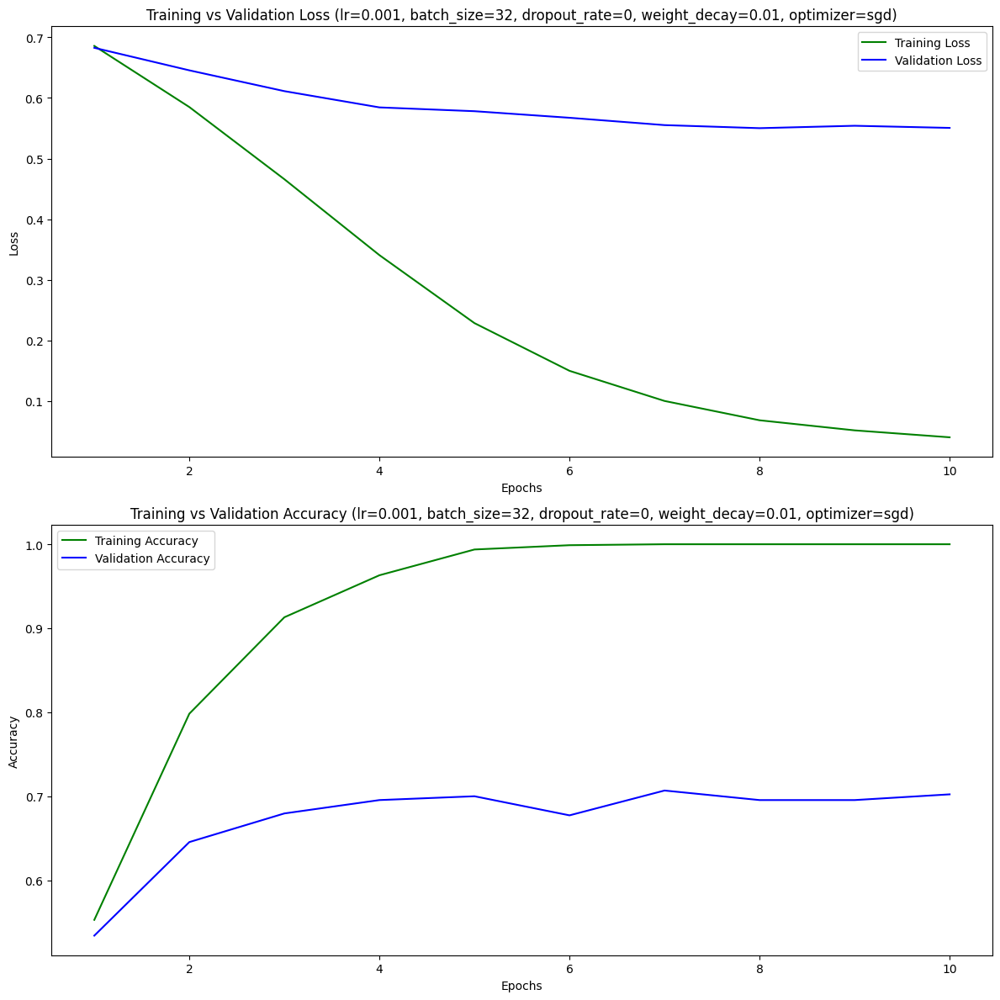

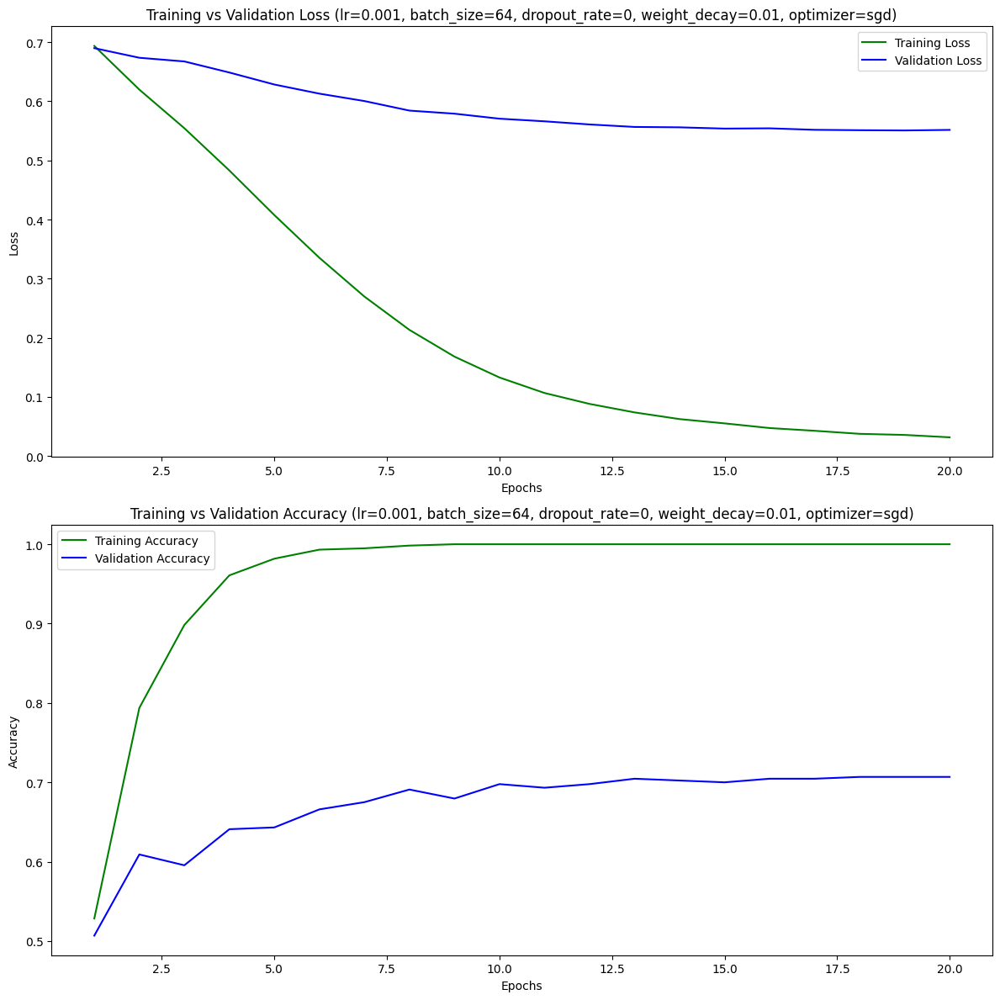

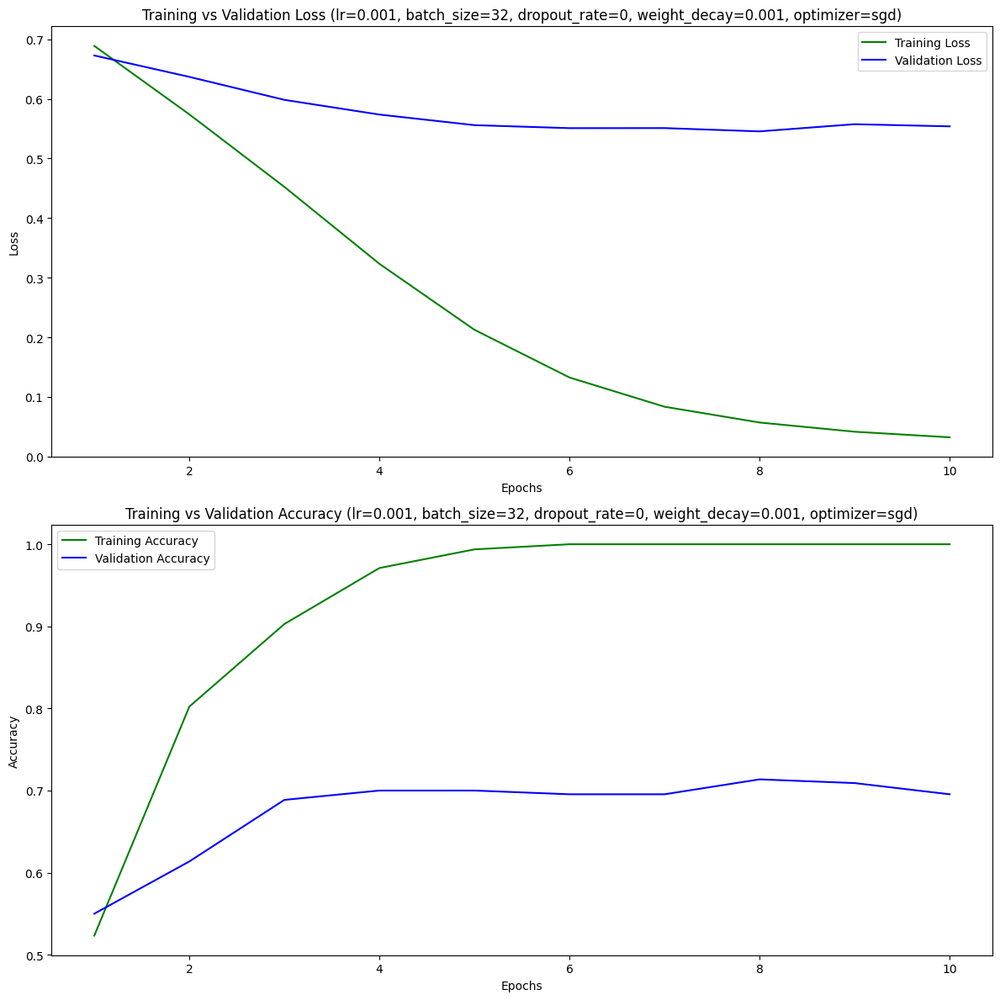

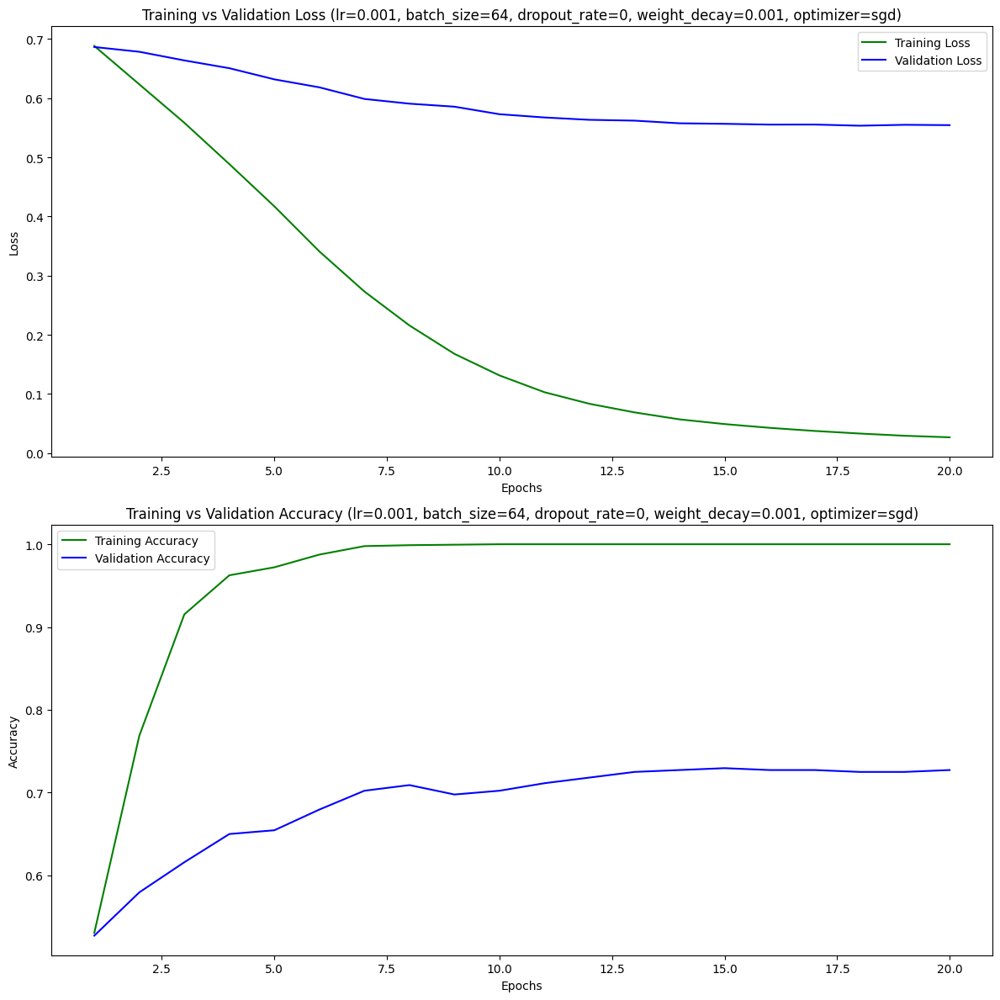

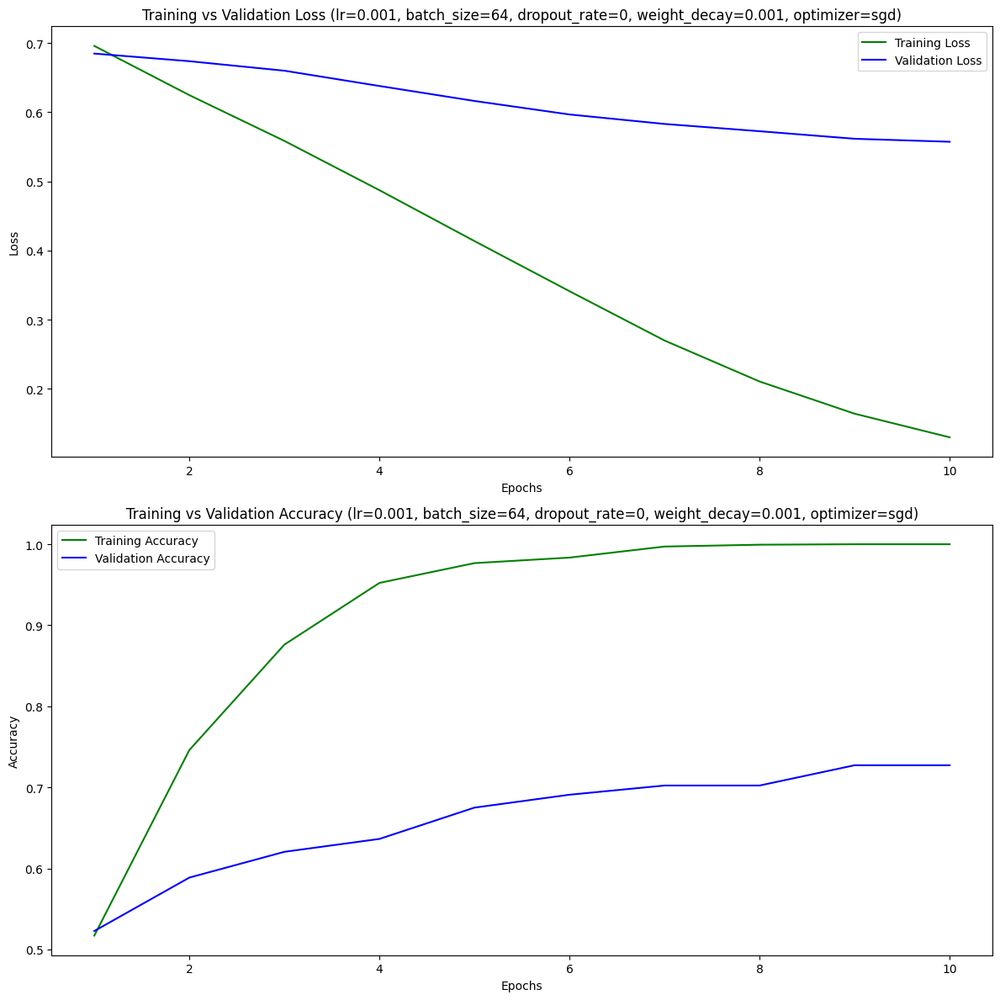

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
best_hyperparams, hyperparameter_results  = find_best_hyperparams(device)


# **Selected Model +  Examples Of Accurate & Misclassifications**

In [ ]:
def initialize_model(dropout_rate):
    model = SiameseModel(dropout_rate=dropout_rate)
    return model.to(device)

def evaluate_model(model, dataloader, criterion):
    model.eval()
    total_loss = 0
    correct_predictions=0
    predictions = 0

    with torch.no_grad():
        for img1, img2, labels in dataloader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device)
            outputs = model(img1, img2)
            loss = criterion(outputs, labels.unsqueeze(1))
            total_loss += loss.item()
            predicted = torch.round(torch.sigmoid(outputs))


            correct_predictions += (predicted == labels.unsqueeze(1)).sum().item()
            predictions += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    accuracy = correct_predictions / predictions
    return avg_loss, accuracy

def evaluate_test_set(model, dataloader_test, criterion):
    avg_test_loss, test_accuracy = evaluate_model(model, dataloader_test, criterion)
    print(f'Test Loss: {avg_test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}')
    return avg_test_loss, test_accuracy


def train_one_epoch(model, optimizer, dataloader, criterion):
    model.train()
    running_loss = 0.0
    correct_predictions= 0
    total_predictions = 0

    for img1, img2, label in (dataloader):
        img1, img2, label = img1.to(device), img2.to(device), label.to(device)
        optimizer.zero_grad()
        outputs = model(img1, img2)
        loss = criterion(outputs, label.unsqueeze(1))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        predicted = torch.round(torch.sigmoid(outputs))

        correct_predictions += (predicted == label.unsqueeze(1)).sum().item()
        total_predictions += label.size(0)

    avg_loss = running_loss / len(dataloader)
    accuracy = correct_predictions / total_predictions
    return avg_loss, accuracy


def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, optimizer_name, lr, bs, dr, wd, epochs):
    # Plot Losses
    num_epochs = len(train_losses)  # Use actual length of lists

    plt.figure(figsize=(12, 12))  # Increase figure height for better spacing

    # Loss plot (Top plot)
    plt.subplot(2, 1, 1)
    plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss", color='green')
    plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(f"Training vs Validation Loss (lr={lr}, batch_size={bs}, dropout_rate={dr}, weight_decay={wd}, optimizer={optimizer_name})")
    plt.legend()

    # Accuracy plot (Bottom plot)
    plt.subplot(2, 1, 2)
    plt.plot(range(1, num_epochs + 1), train_accuracies, label="Training Accuracy", color='green')
    plt.plot(range(1, num_epochs + 1), val_accuracies, label="Validation Accuracy", color='blue')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.title(f"Training vs Validation Accuracy (lr={lr}, batch_size={bs}, dropout_rate={dr}, weight_decay={wd}, optimizer={optimizer_name})")
    plt.legend()

    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()


def find_best_hyperparams(device):
    best_val_loss = float('inf')
    best_hyperparams = None
    hyperparameter_results = []
    models =[]
    criterion = nn.BCEWithLogitsLoss()

    # enter here the params for the selected model :
    #------change-------
    hyperparameter_grid = {
        "lr": [0.0001],
        "batch_size": [64],
        "dropout_rate": [0.4], #addind dropout to handle overfitting
        "weight_decay": [0.01],
        "epochs": [20],
        "optimizer": ["adam"]
    }

    # Grid search
    for lr in hyperparameter_grid["lr"]:
        for bs in hyperparameter_grid["batch_size"]:
            for dr in hyperparameter_grid["dropout_rate"]:
                for wd in hyperparameter_grid["weight_decay"]:
                    for epochs in hyperparameter_grid["epochs"]:
                        for optimizer_name in hyperparameter_grid["optimizer"]:  # Loop over optimizer types
                            # Initialize model

                            model = initialize_model(dr)

                            # Choose optimizer
                            if optimizer_name == "adam":
                                optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
                            elif optimizer_name == "sgd":
                                optimizer = torch.optim.SGD(model.parameters(), lr=lr, weight_decay=wd,momentum=0.9)

                            dataloader_train = DataLoader(dataset=train_set, batch_size=bs, shuffle=True)
                            dataloader_val = DataLoader(dataset=validation_set, batch_size=bs, shuffle=False)
                            dataloader_test = DataLoader(dataset=test_dataset, batch_size=bs, shuffle=False)

                            early_stop_counter = 5
                            print(f"Analyzing Hyperparameters: lr={lr}, batch_size={bs}, dropout_rate={dr}, weight_decay={wd}, epochs={epochs}, optimizer={optimizer_name}")


                            train_losses = []
                            val_losses = []
                            train_accuracies = []
                            val_accuracies = []

                            for epoch in range(epochs):

                                train_loss, train_accuracy = train_one_epoch(model, optimizer, dataloader_train, criterion)
                                val_loss, val_accuracy = evaluate_model(model, dataloader_val, criterion)

                                train_losses.append(train_loss)
                                val_losses.append(val_loss)
                                train_accuracies.append(train_accuracy)
                                val_accuracies.append(val_accuracy)

                                print(f"Epoch [{epoch + 1}/{epochs}], "
                                      f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}, "
                                      f"Valid Loss: {val_loss:.4f}, Valid Accuracy: {val_accuracy:.4f}")

                                # Early stopping and best hyperparameters
                                if val_loss < best_val_loss:
                                    best_val_loss = val_loss
                                    best_hyperparams = {
                                        "lr": lr, "batch_size": bs, "dropout_rate": dr, "weight_decay": wd,
                                        "epochs": epochs, "optimizer": optimizer_name
                                    }
                                    early_stop_counter = 5
                                else:
                                    early_stop_counter -= 1

                                if early_stop_counter <= 0:
                                    print(f"Early stopping at epoch {epoch + 1}")
                                    break
                            #final

                            plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                                         optimizer_name, lr, bs, dr, wd, epochs)

                            test_loss, test_accuracy = evaluate_test_set(model, dataloader_test, criterion)

    return model


# **Final Model**

Analyzing Hyperparameters: lr=0.0001, batch_size=64, dropout_rate=0.4, weight_decay=0.01, epochs=20, optimizer=adam
Epoch [1/20], Train Loss: 0.7627, Train Accuracy: 0.5216, Valid Loss: 0.6925, Valid Accuracy: 0.5205
Epoch [2/20], Train Loss: 0.5954, Train Accuracy: 0.6932, Valid Loss: 0.6800, Valid Accuracy: 0.5136
Epoch [3/20], Train Loss: 0.4908, Train Accuracy: 0.7886, Valid Loss: 0.6856, Valid Accuracy: 0.5341
Epoch [4/20], Train Loss: 0.4032, Train Accuracy: 0.8574, Valid Loss: 0.7706, Valid Accuracy: 0.5136
Epoch [5/20], Train Loss: 0.3105, Train Accuracy: 0.9068, Valid Loss: 0.7637, Valid Accuracy: 0.5523
Epoch [6/20], Train Loss: 0.2282, Train Accuracy: 0.9426, Valid Loss: 0.8801, Valid Accuracy: 0.5091
Epoch [7/20], Train Loss: 0.1831, Train Accuracy: 0.9591, Valid Loss: 0.7477, Valid Accuracy: 0.5909
Early stopping at epoch 7


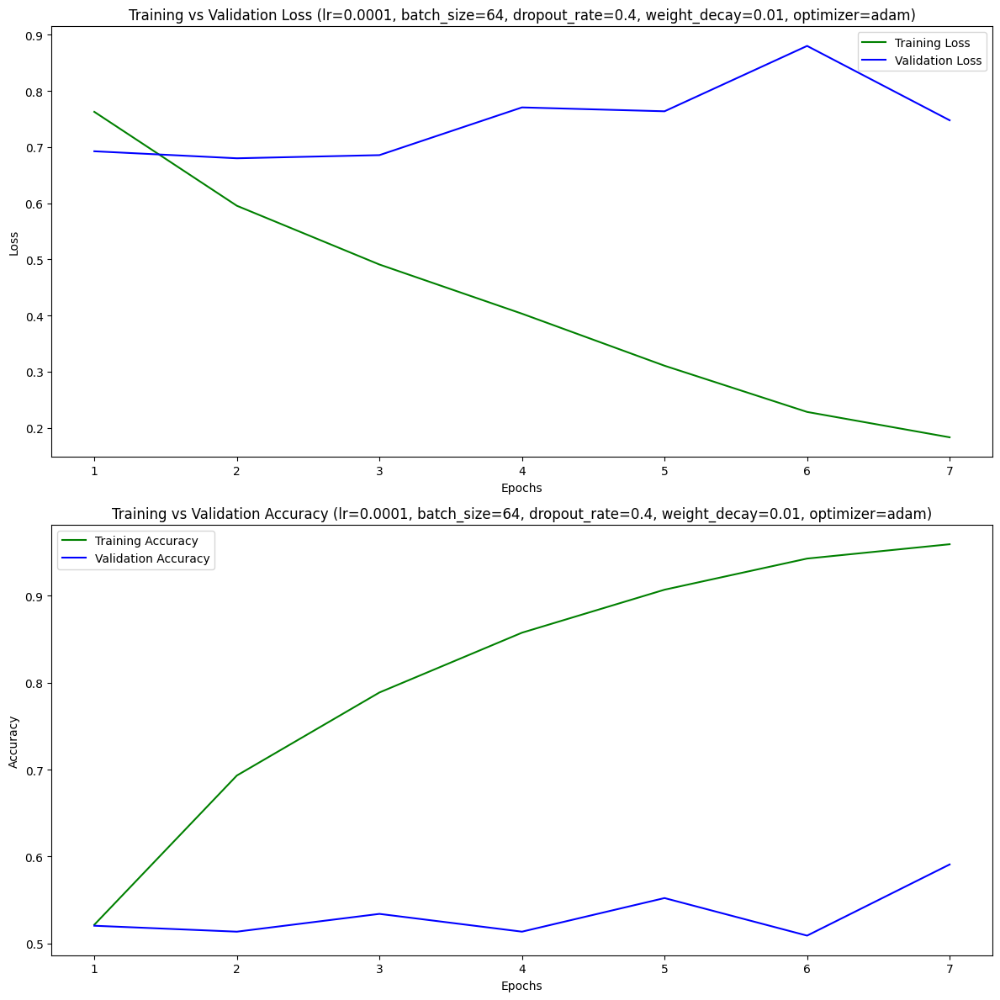

Test Loss: 0.8017, Test Accuracy: 0.5510


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model  = find_best_hyperparams(device)


In [ ]:
#training the last model version :
model

SiameseModel(
  (layers): Sequential(
    (0): Conv2d(1, 64, kernel_size=(10, 10), stride=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(7, 7), stride=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 128, kernel_size=(4, 4), stride=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(4, 4), stride=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU(inplac

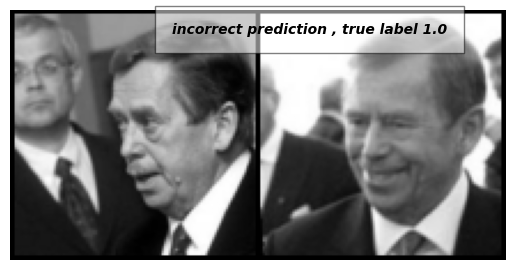

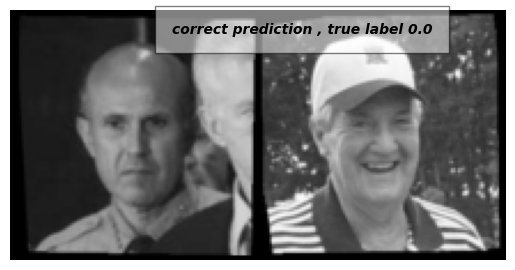

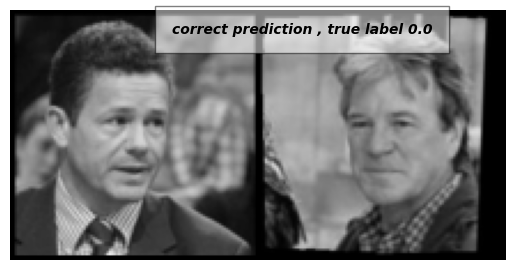

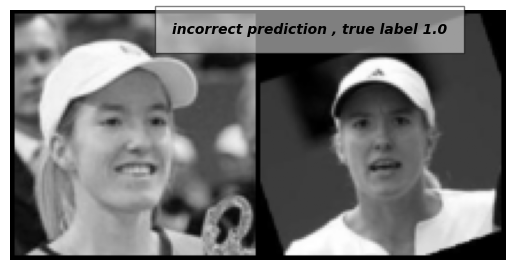

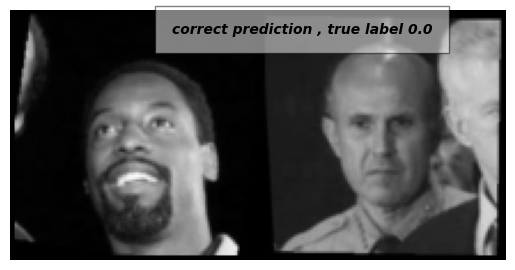

...

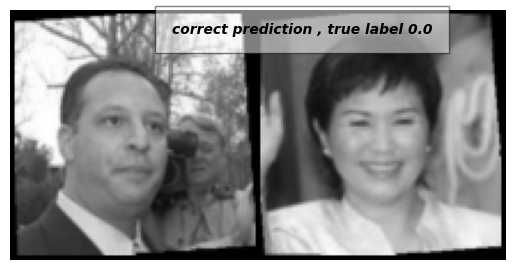

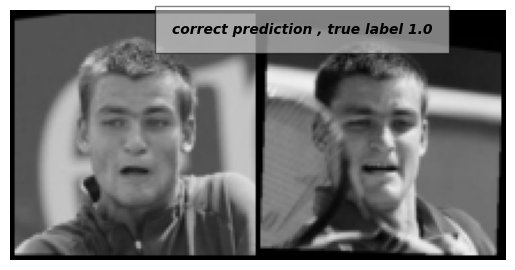

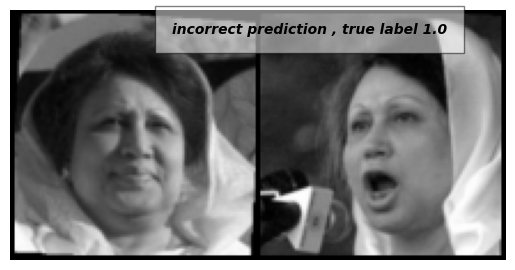

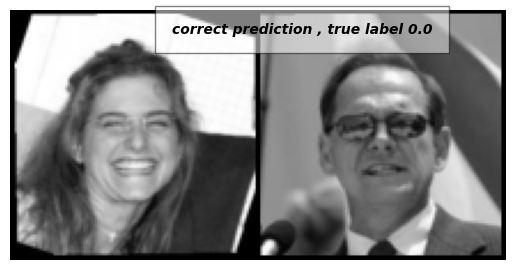

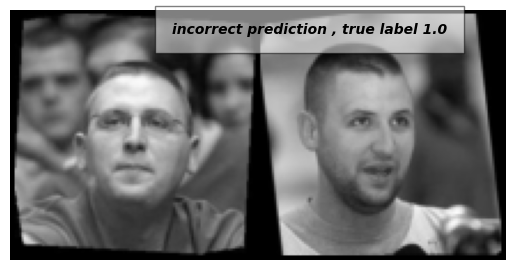

In [ ]:
def show(img, label=None):
    """
    Displays an image with an optional label overlay.
    """
    npimg = img.numpy()
    plt.axis("off")
    if label:
        plt.text(70, 10, label, style='italic', fontweight='bold',
                 bbox={'facecolor': 'white', 'alpha': 0.5, 'pad': 12})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


def process_image_pair(img1, img2, description):
    """
    Processes and displays a pair of images with a descriptive label.
    """
    img1_cpu = img1.unsqueeze(0).cpu()
    img2_cpu = img2.unsqueeze(0).cpu()
    concatenated = torch.cat((img1_cpu, img2_cpu), 0)
    show(torchvision.utils.make_grid(concatenated), description)


def evaluate_model(img1, img2, outputs, label):
    """
    Evaluates predictions by displaying pairs of images with descriptions of correctness.
    """
    for j in range(outputs.size(0)):
        if (outputs[j] > 0.5 and label[j] == 1) or (outputs[j] <= 0.5 and label[j] == 0):
            process_image_pair(img1[j], img2[j], f'correct prediction, true label {label[j]}')
        else:
            process_image_pair(img1[j], img2[j], f'incorrect prediction, true label {label[j]}')


def main():
    """
    Main function for evaluating a test dataset and displaying predictions.
    """
    dataloader_test_img = DataLoader(dataset=test_dataset, batch_size=200, shuffle=True)
    example_batch = next(iter(dataloader_test_img))
    img1 = example_batch[0].to(device)
    img2 = example_batch[1].to(device)
    label = example_batch[2].to(device)
    outputs = model(img1, img2)
    evaluate_model(img1, img2, outputs, label)


main()
